### Loading libraries

In [85]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt 
import matplotlib.cm as cm
import numpy as np
import os
import pandas as pd 

### Gender, movie and dialogue-wise analysis

#### File Structure

In [21]:
for dirname, _, filenames in os.walk('MCU18/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

MCU18/characters.csv
MCU18/mcu.csv
MCU18/mcu_subset.csv
MCU18/movies.csv
MCU18/script pdfs\avengers-endgame-script-slug.pdf
MCU18/script pdfs\avengers-script-slug.pdf
MCU18/script pdfs\black-panther-script-slug.pdf
MCU18/script pdfs\guardians-2-script-slug.pdf
MCU18/script pdfs\iron-man-script-slug.pdf
MCU18/script pdfs\thor-ragnarok-script-slug.pdf
MCU18/script pdfs\thor-script-slug.pdf
MCU18/script txts\age_of_ultron.txt
MCU18/script txts\ant_man.txt
MCU18/script txts\avengers-endgame-script-slug.txt
MCU18/script txts\avengers-script-slug.txt
MCU18/script txts\black-panther-script-slug.txt
MCU18/script txts\captain_america.txt
MCU18/script txts\captain_marvel.txt
MCU18/script txts\civil_war.txt
MCU18/script txts\guardians_2.txt
MCU18/script txts\infinity_war.txt
MCU18/script txts\iron-man-script-slug.txt
MCU18/script txts\iron_man_2.txt
MCU18/script txts\iron_man_3.txt
MCU18/script txts\spider_man_homecoming.txt
MCU18/script txts\thor-ragnarok-script-slug.txt
MCU18/script txts\thor-s

#### Reading files

In [131]:
nRowsRead = None 
df1 = pd.read_csv('MCU18/characters.csv', delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'characters.csv'
nRow, nCol = df1.shape

In [132]:
df1.head(5)

,character,Ant-Man,Avengers: Age of Ultron,Avengers: Endgame,Avengers: Infinity War,Black Panther,Captain America: Civil War,Captain America: The First Avenger,Captain America: The Winter Soldier,Captain Marvel,...,Spider-Man: Homecoming,The Avengers,Thor,Thor: Ragnarok,Thor: The Dark World,total lines,total words,movie appearances,avg words per line,avg lines per movie
0,TONY STARK,0,173,137,119,0,165,0,0,0,...,74,152,0,0,0,1788,22590,9,12,198
1,STEVE ROGERS,3,133,119,25,0,154,186,218,3,...,7,121,0,0,0,977,8653,10,8,97
2,THOR,0,55,70,74,0,0,0,0,0,...,0,47,166,289,133,863,9487,7,10,123
3,PETER PARKER,0,0,7,39,0,73,0,0,0,...,402,0,0,0,0,551,5517,4,10,137
4,NATASHA ROMANOFF,1,79,69,15,0,64,0,112,3,...,0,97,0,1,0,498,4689,10,9,49


In [133]:
mcu_dataset = pd.read_csv('MCU18/mcu.csv')
print(mcu_dataset.columns)

Index(['Unnamed: 0', 'character', 'line', 'movie', 'year', 'words',
       'Adam McKay', 'Anna Boden', 'Art Marcum', 'Ashley Edward Miller',
       'Chris McKenna', 'Christopher Ford', 'Christopher Markus',
       'Christopher Yost', 'Craig Kyle', 'Don Payne', 'Drew Pearce',
       'Edgar Wright', 'Eric Pearson', 'Erik Sommers',
       'Geneva Robertson-Dworet', 'Hawk Ostby', 'James Gunn', 'Joe Cornish',
       'Joe Robert Cole', 'John Francis Daley', 'Jon Watts',
       'Jonathan Goldstein', 'Joss Whedon', 'Justin Theroux', 'Mark Fergus',
       'Matt Holloway', 'Paul Rudd', 'Ryan Coogler', 'Ryan Fleck',
       'Shane Black', 'Stephen McFeely', 'Zack Stentz'],
      dtype='object')


In [134]:
all_movies = mcu_dataset['movie'].unique() 
print(all_movies)

['Iron Man' 'Iron Man 2' 'Thor' 'Captain America: The First Avenger'
 'The Avengers' 'Iron Man 3' 'Thor: The Dark World'
 'Captain America: The Winter Soldier' 'Avengers: Age of Ultron' 'Ant-Man'
 'Captain America: Civil War' 'Guardians of the Galaxy Vol. 2'
 'Spider-Man: Homecoming' 'Thor: Ragnarok' 'Black Panther'
 'Avengers: Infinity War' 'Captain Marvel' 'Avengers: Endgame']


In [135]:
characters = mcu_dataset['character'].unique()
character_words = mcu_dataset.groupby('character')['words'].sum()
character_dialogues = mcu_dataset.groupby('character')['words'].count()
character_words = character_words.sort_values(ascending=False)
character_dialogues = character_dialogues.sort_values(ascending=False)

In [136]:
character_words = character_words[:10]
character_dialogues = character_dialogues[:10]

In [137]:
print(character_dialogues)

character
TONY STARK          1788
STEVE ROGERS         977
THOR                 863
PETER PARKER         551
NATASHA ROMANOFF     498
PEPPER POTTS         442
BRUCE BANNER         379
NICK FURY            366
LOKI                 327
SCOTT LANG           324
Name: words, dtype: int64


In [138]:
print(character_words)

character
TONY STARK          22590
THOR                 9487
STEVE ROGERS         8653
PETER PARKER         5517
NATASHA ROMANOFF     4689
NICK FURY            4524
LOKI                 4097
BRUCE BANNER         3840
PEPPER POTTS         3492
JAMES RHODES         3486
Name: words, dtype: int64


In [139]:
character_gender = {
    'TONY STARK' : 'M', 
    'THOR' : 'M',
    'STEVE ROGERS' : 'M',
    'PETER PARKER' : 'M',
    'NATASHA ROMANOFF' : 'F',
    'NICK FURY' : 'M',
    'LOKI' : 'M',
    'BRUCE BANNER' : 'M',
    'PEPPER POTTS' : 'F',
    'JAMES RHODES' : 'M',
    'SCOTT LANG' : 'M',
}

In [140]:
gender_colors = {'M': 'blue', 'F': 'red'}
characters = character_words.index
words = character_words.values
dialogues = character_dialogues.values

#### Top 10 characters by the number of words, along with gender

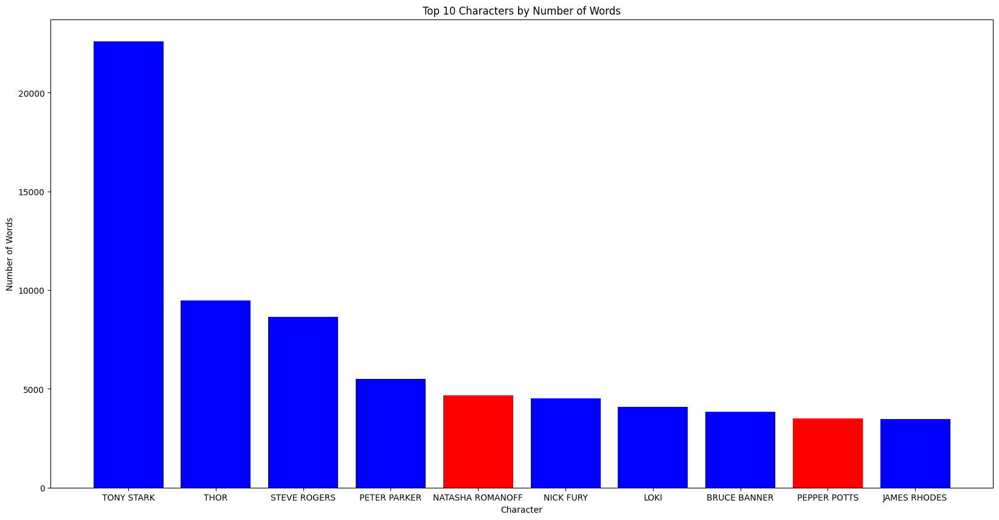

In [141]:
plt.figure(figsize=(20, 10))
for character, word_count in zip(characters, words):
    gender = character_gender[character]
    color = gender_colors[gender]
    plt.bar(character, word_count, color=color) 
plt.xlabel('Character')
plt.ylabel('Number of Words')
plt.title('Top 10 Characters by Number of Words')
plt.show()


#### Top 10 characters by the number of dialogues, along with gender

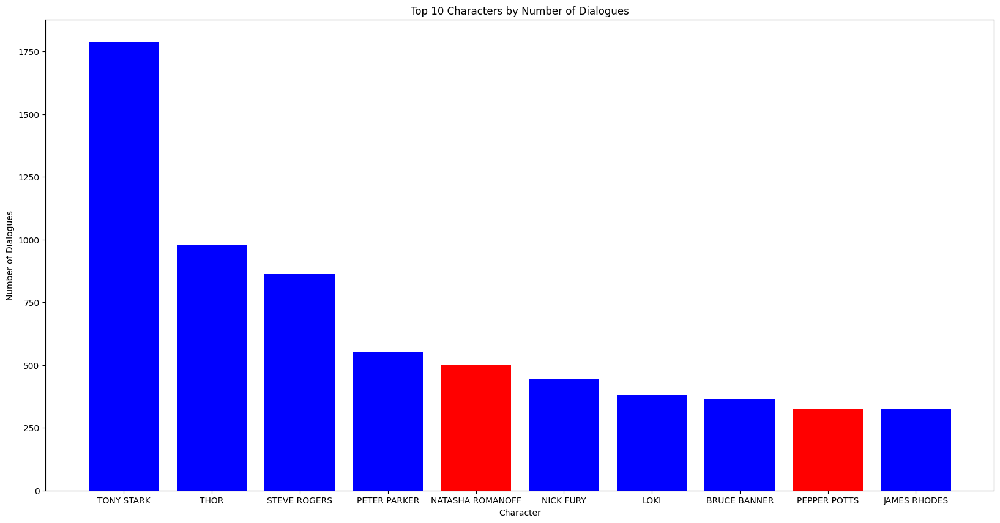

In [142]:
plt.figure(figsize=(20, 10))
for character, dialogue_count in zip(characters, dialogues): 
    gender = character_gender[character]
    color = gender_colors[gender]
    plt.bar(character, dialogue_count, color=color)
plt.xlabel('Character')
plt.ylabel('Number of Dialogues')
plt.title('Top 10 Characters by Number of Dialogues')
plt.show()


In [143]:
movie_words = mcu_dataset.groupby('movie')['words'].sum()
movie_words = movie_words.sort_values(ascending=False)
movie_words = movie_words[:10]
movie_dialogues = mcu_dataset.groupby('movie')['words'].count()
movie_dialogues = movie_dialogues.sort_values(ascending=False)
movie_dialogues = movie_dialogues[:10]

#### Top 10 movies by the number of words

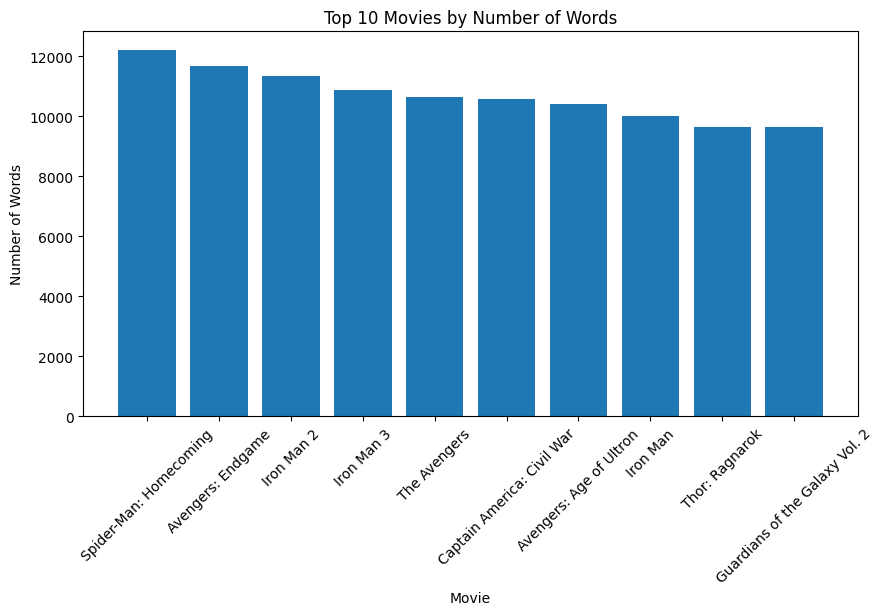

In [144]:
# plotting the top 10 movies by number of words
movies = movie_words.index
words = movie_words.values
plt.figure(figsize=(10, 5))
plt.bar(movies, words)
plt.xlabel('Movie')
plt.ylabel('Number of Words')
plt.title('Top 10 Movies by Number of Words')
plt.xticks(rotation=45)
plt.show()

#### Top 10 movies by the number of dialogues

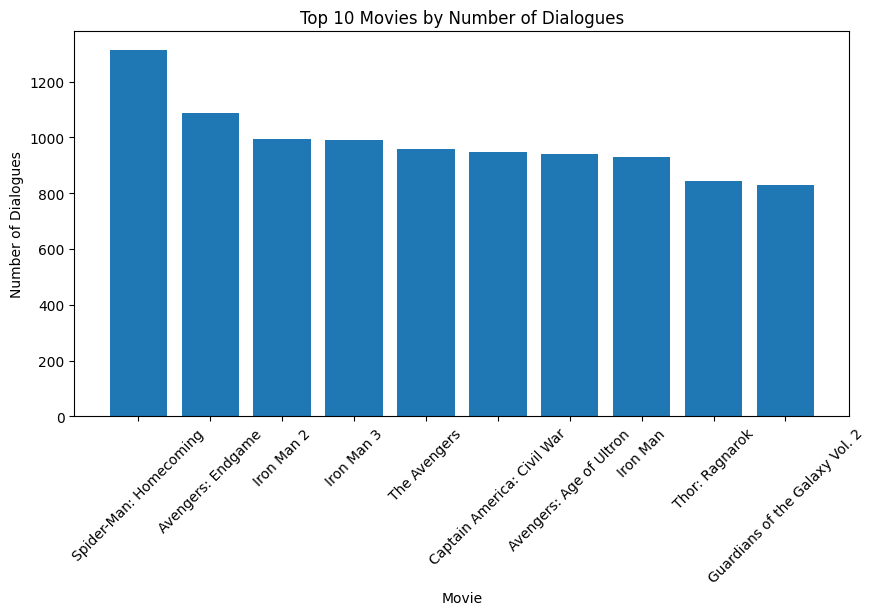

In [145]:
# plotting the top 10 movies by number of dialogues
movies = movie_words.index
dialogues = movie_dialogues.values
plt.figure(figsize=(10, 5))
plt.bar(movies, dialogues)
plt.xlabel('Movie')
plt.ylabel('Number of Dialogues')
plt.title('Top 10 Movies by Number of Dialogues')
plt.xticks(rotation=45)
plt.show()

#### Movie-wise character-wise distribution per words

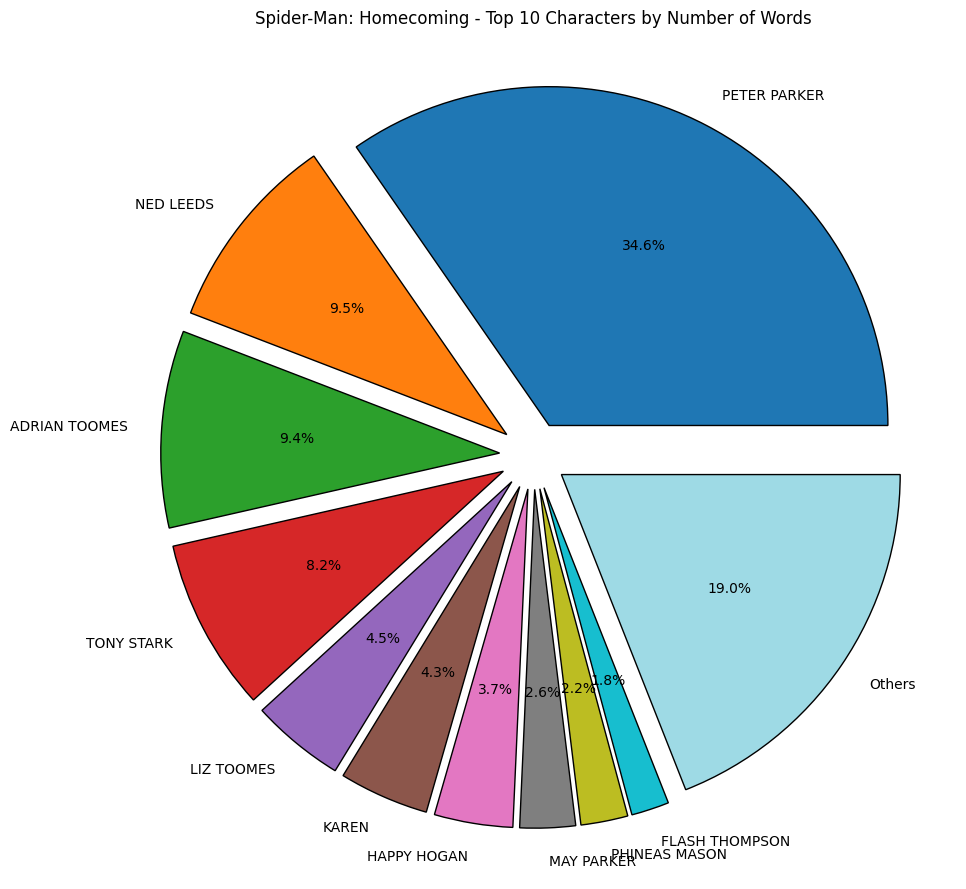

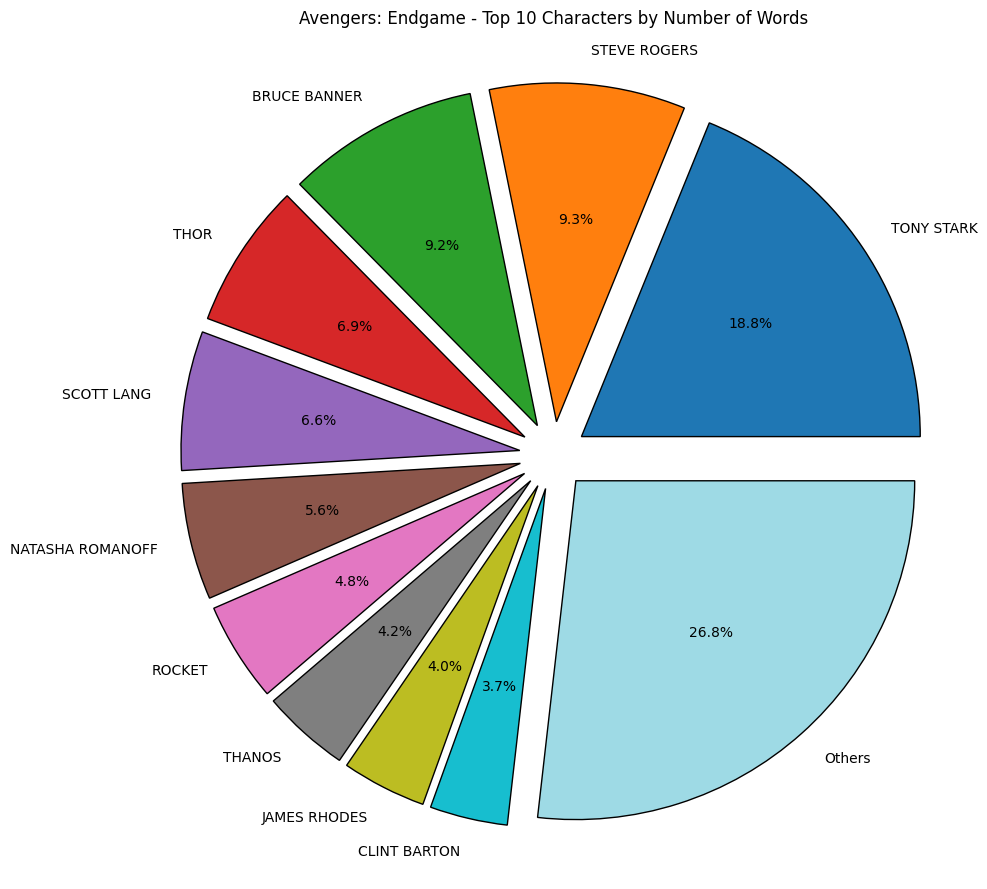

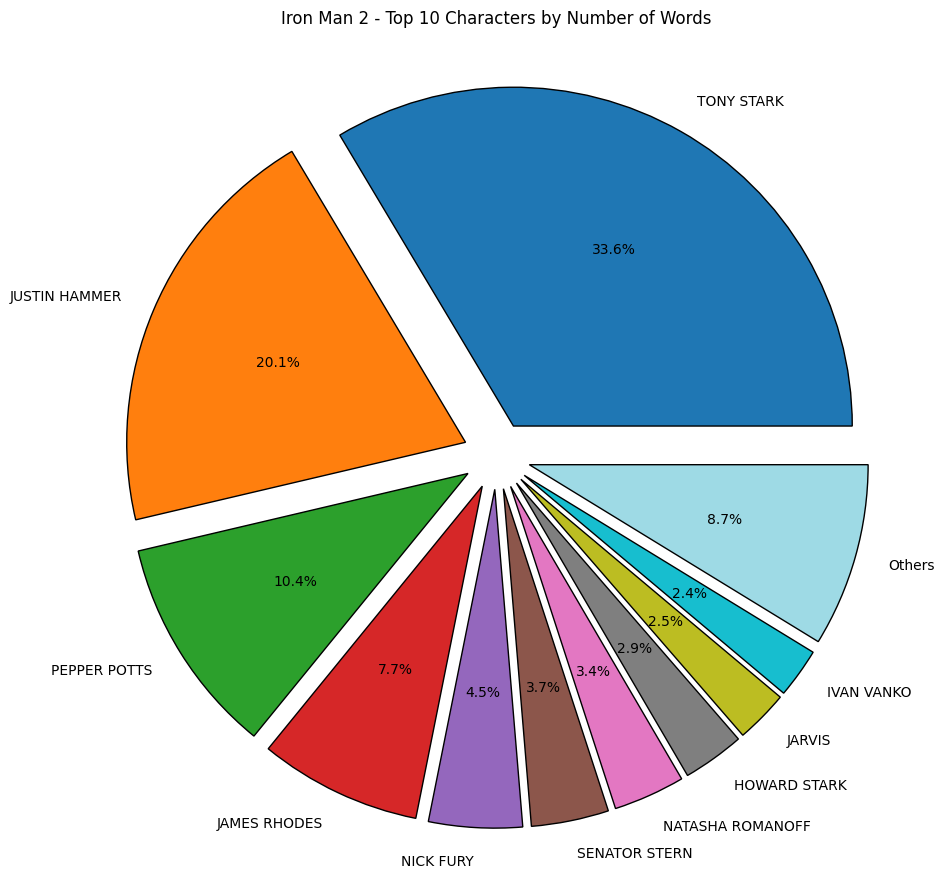

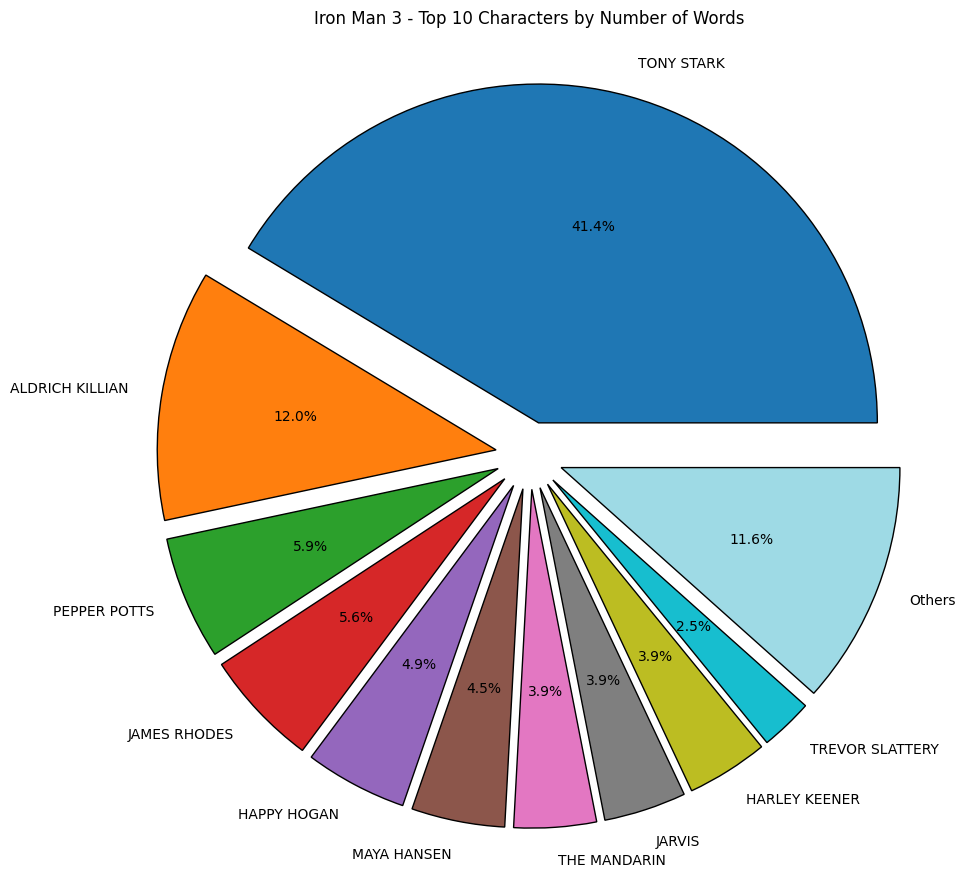

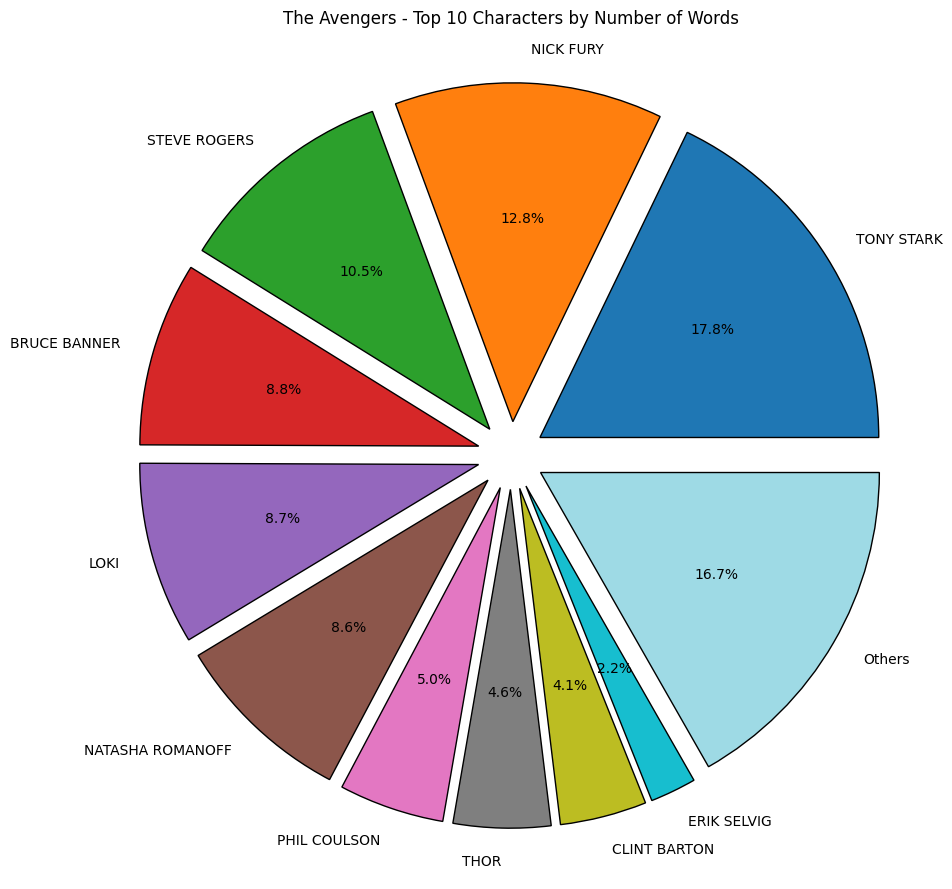

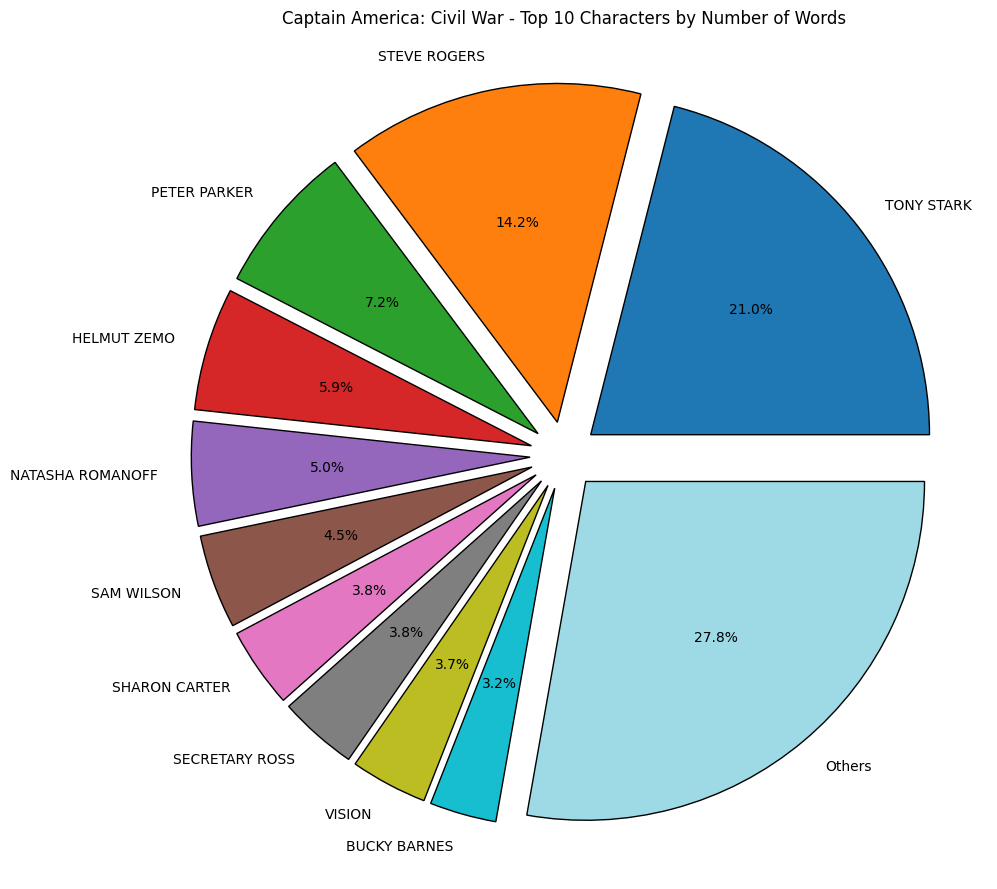

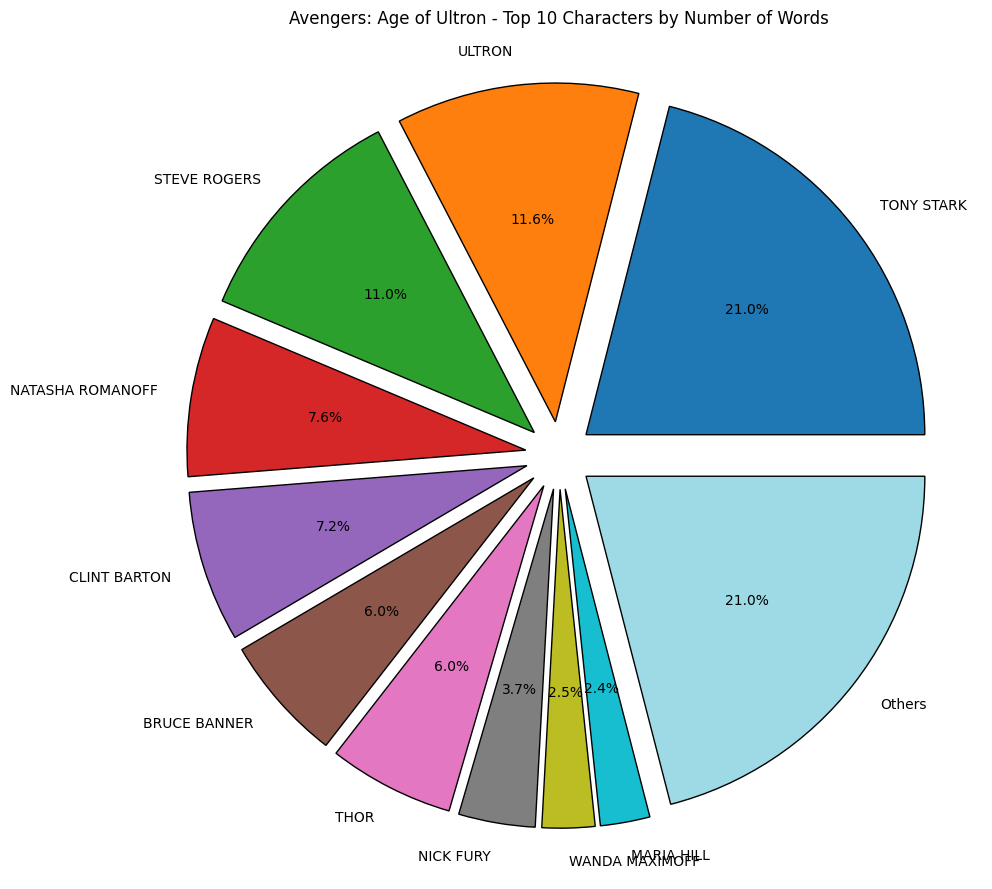

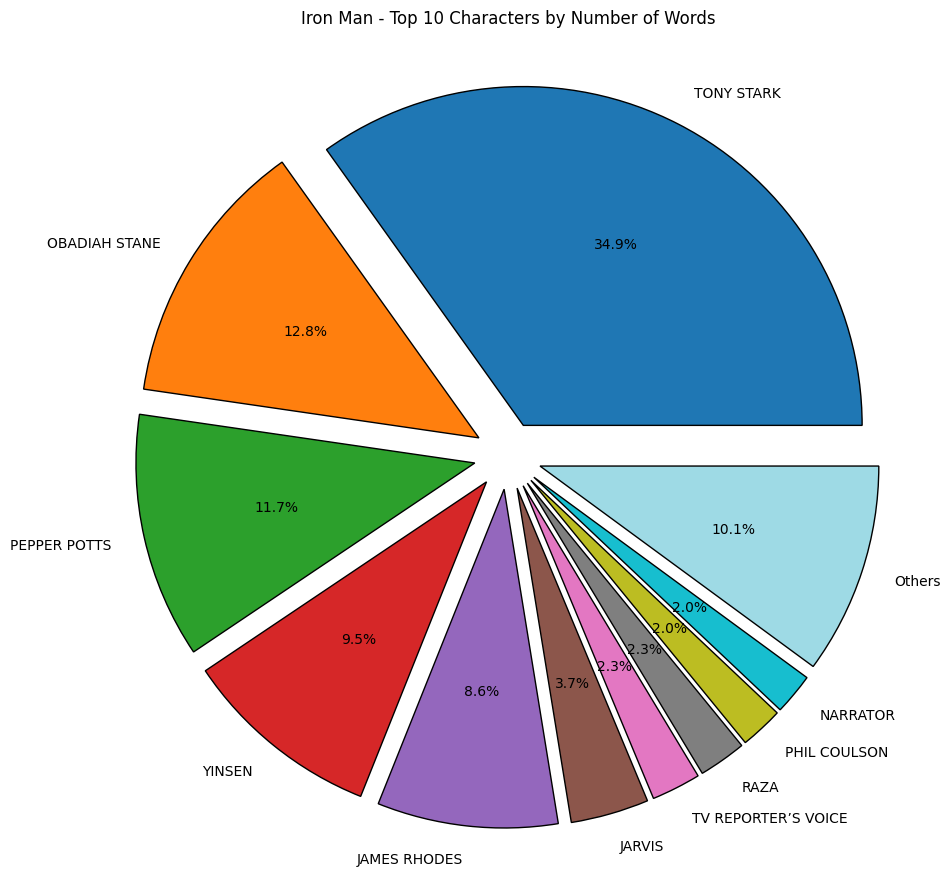

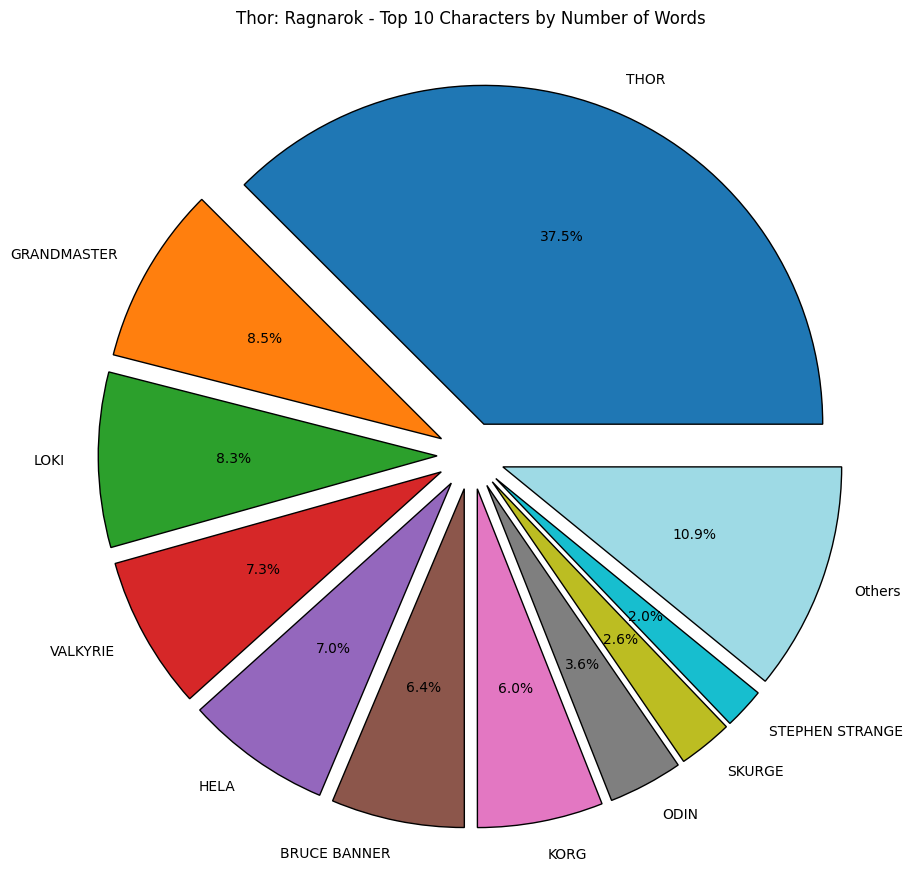

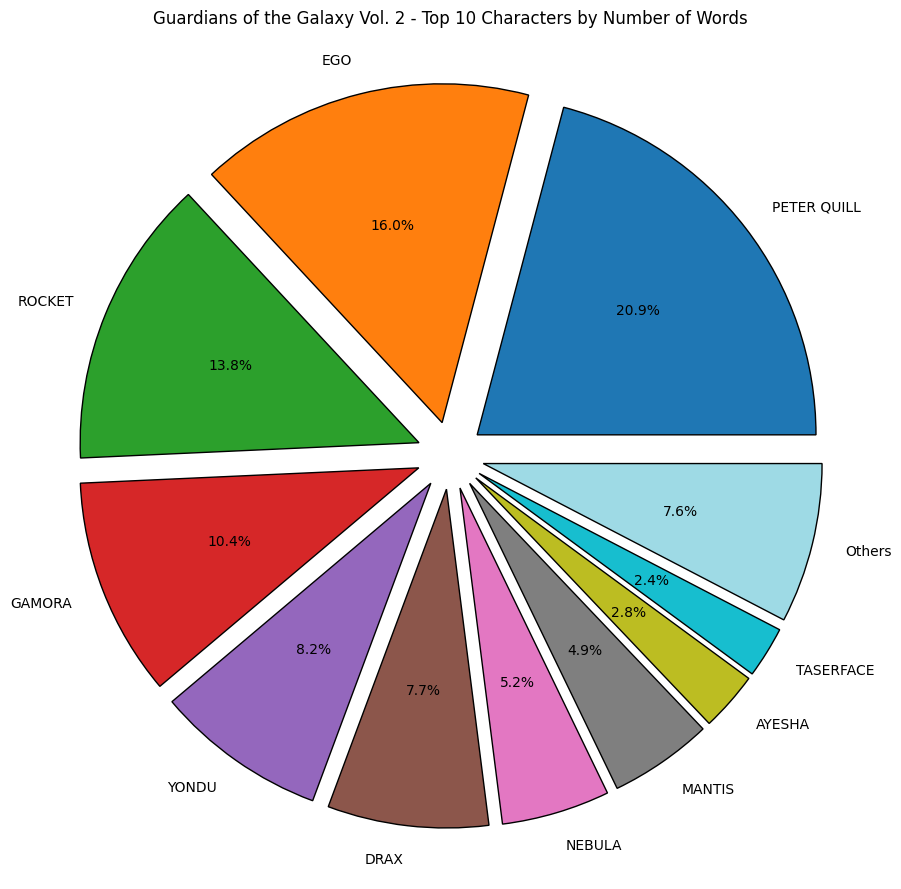

In [146]:
# for each of the top 10 movies by words, plotting the number of words spoken by each character
top_10_movies = movie_words.index
for movie in top_10_movies:
    movie_data = mcu_dataset[mcu_dataset['movie'] == movie]
    movie_character_words = movie_data.groupby('character')['words'].sum()
    movie_character_words = movie_character_words.sort_values(ascending=False)
    others = movie_character_words[10:].sum()
    movie_character_words = movie_character_words[:10]
    characters = movie_character_words.index
    words = movie_character_words.values
    characters = np.append(characters[:10], 'Others')
    words = np.append(words, others)
    colors = cm.tab20(np.linspace(0, 1, len(characters)))
    explode = np.ones(len(characters)) * 0.1
    plt.figure(figsize=(11, 11))
    plt.pie(words, labels=characters, autopct='%1.1f%%', colors=colors, explode=explode, wedgeprops={'edgecolor': 'black'})
    plt.title(f'{movie} - Top 10 Characters by Number of Words')
    plt.show()  

#### Movie-wise character-wise distribution per dialogues

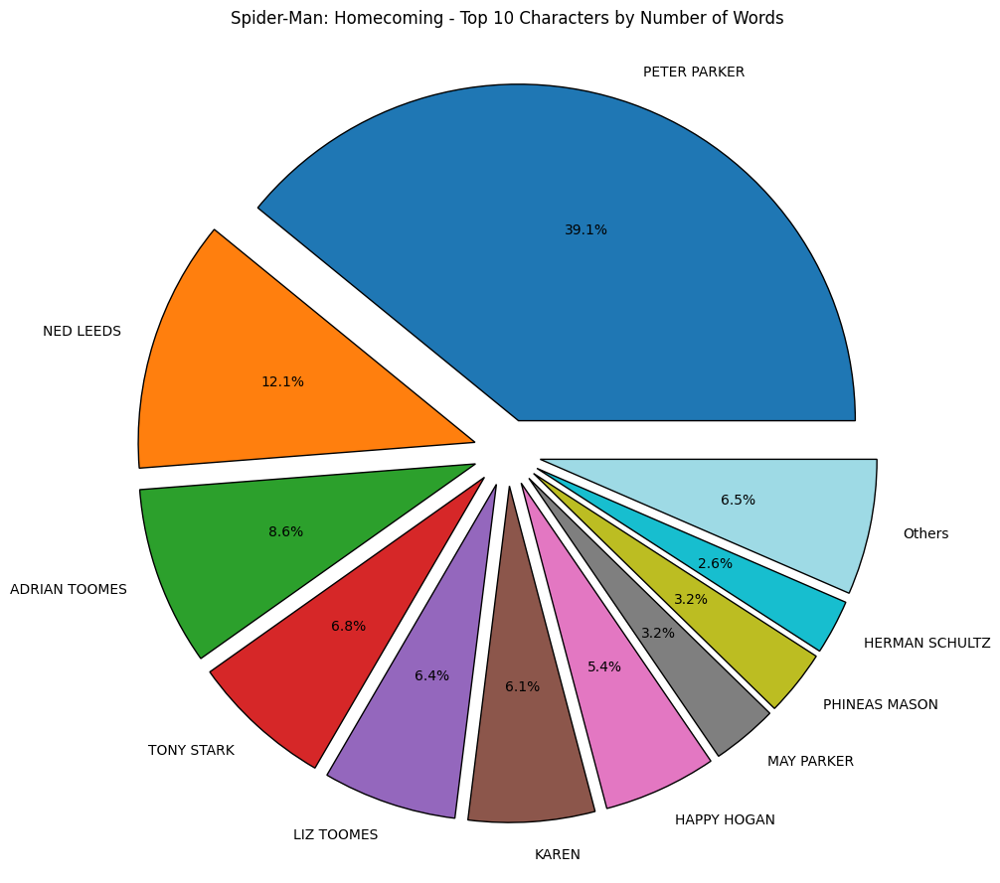

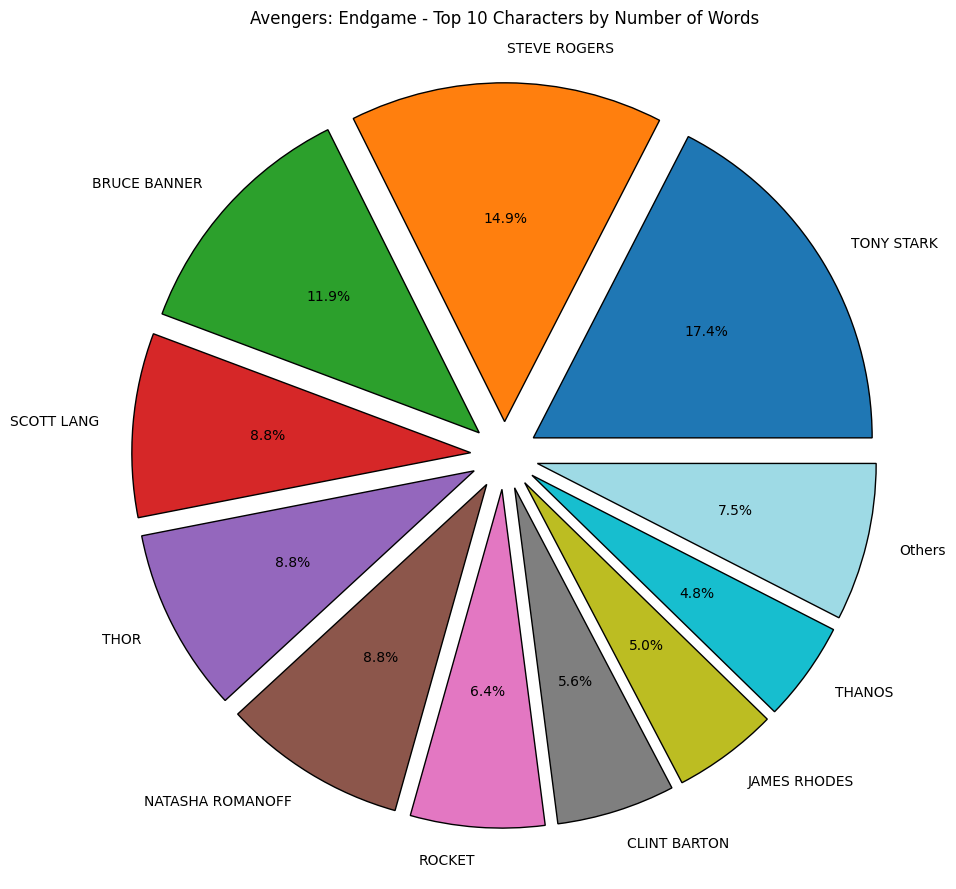

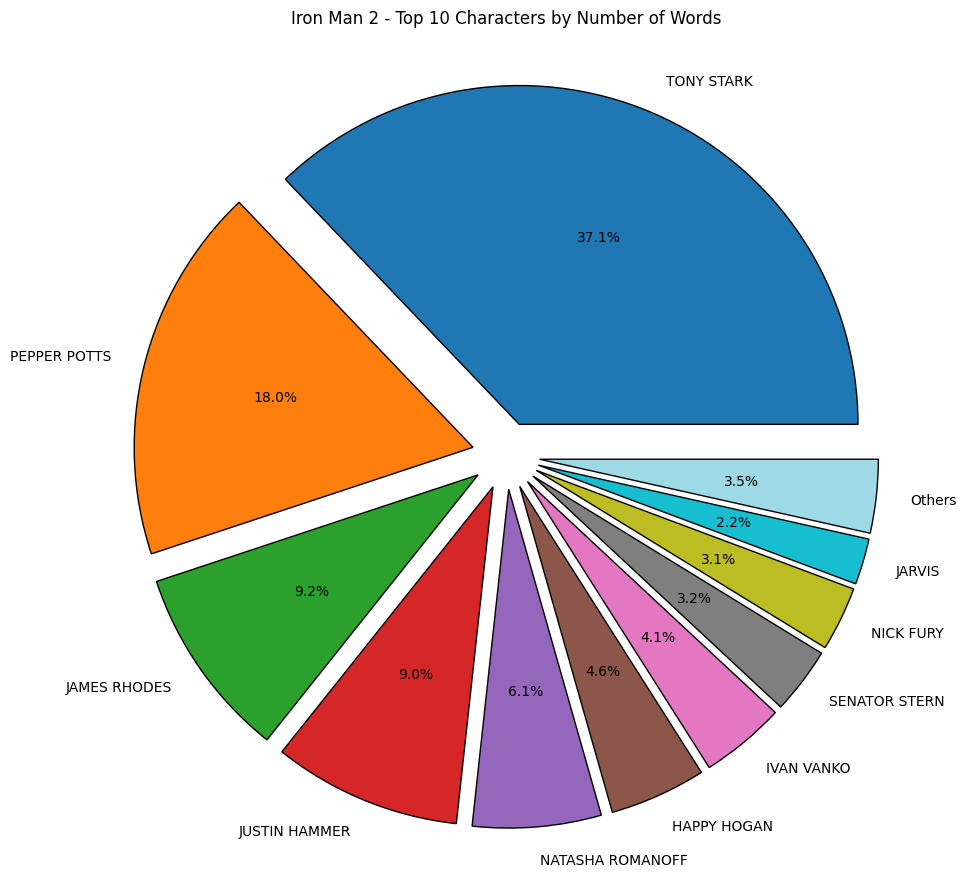

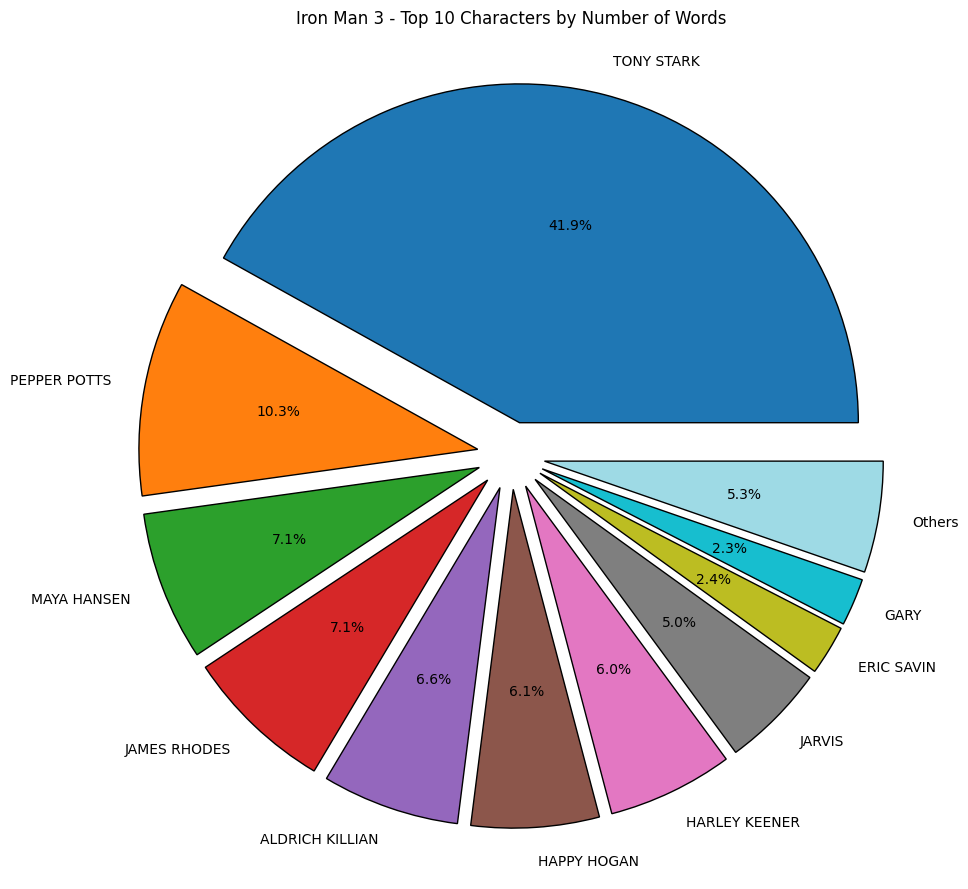

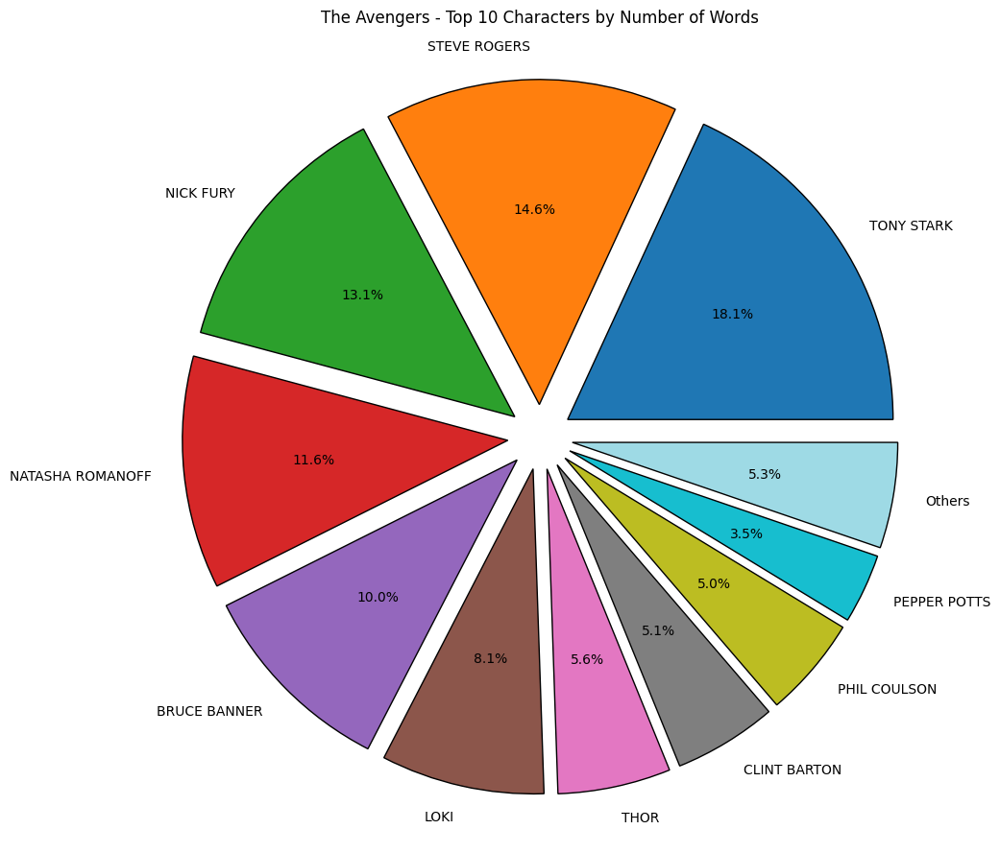

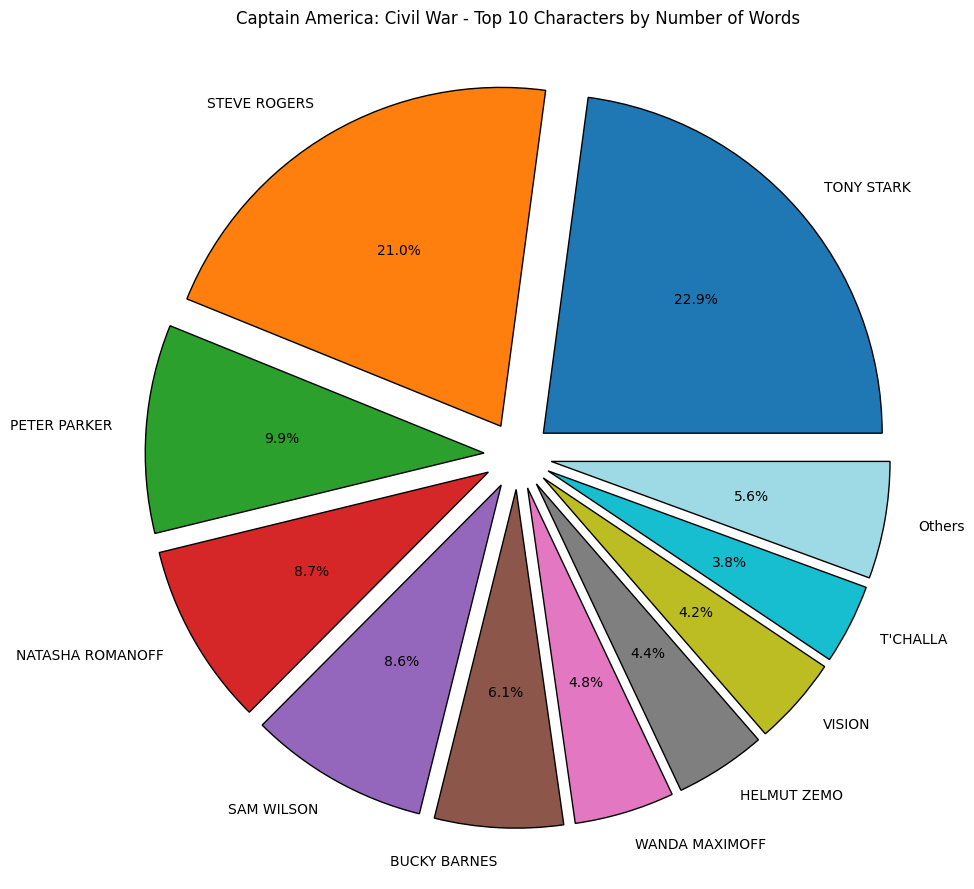

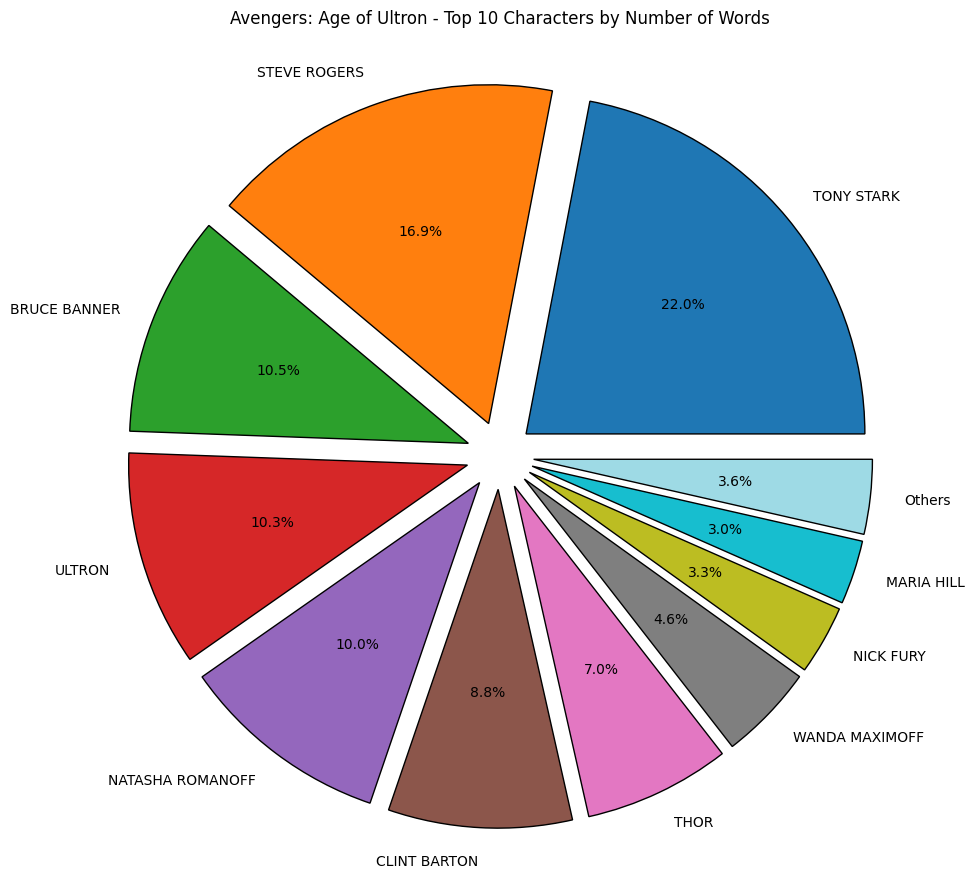

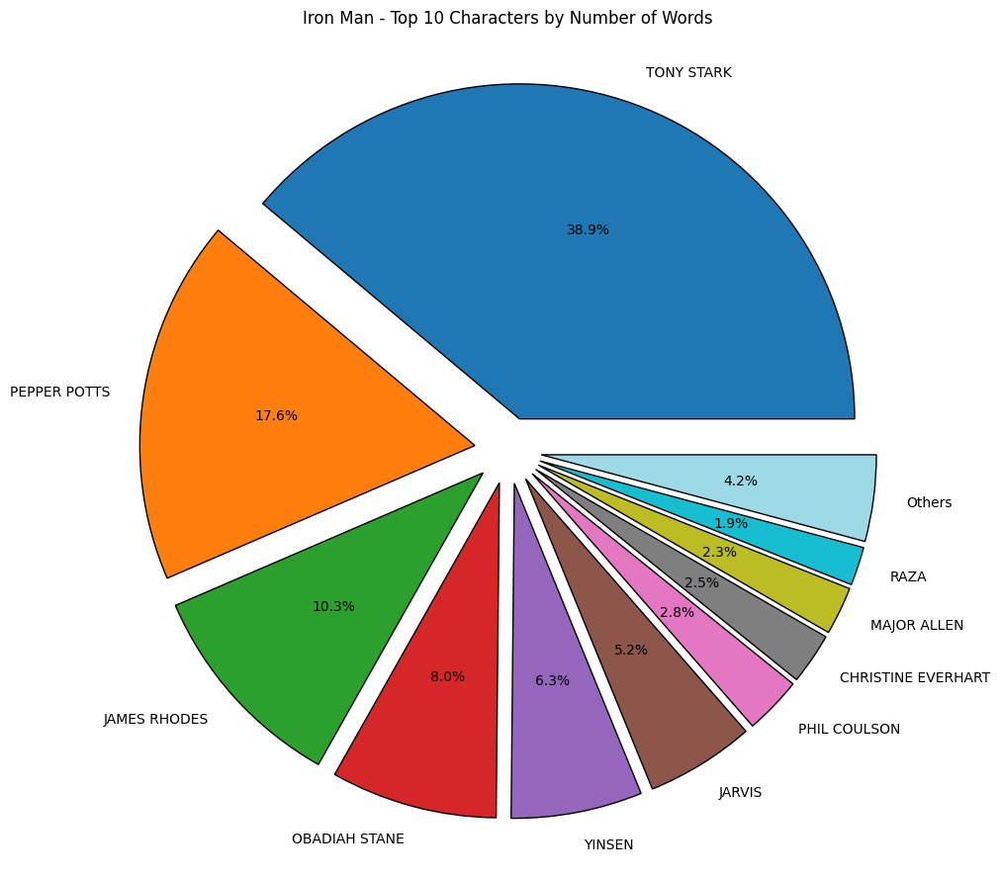

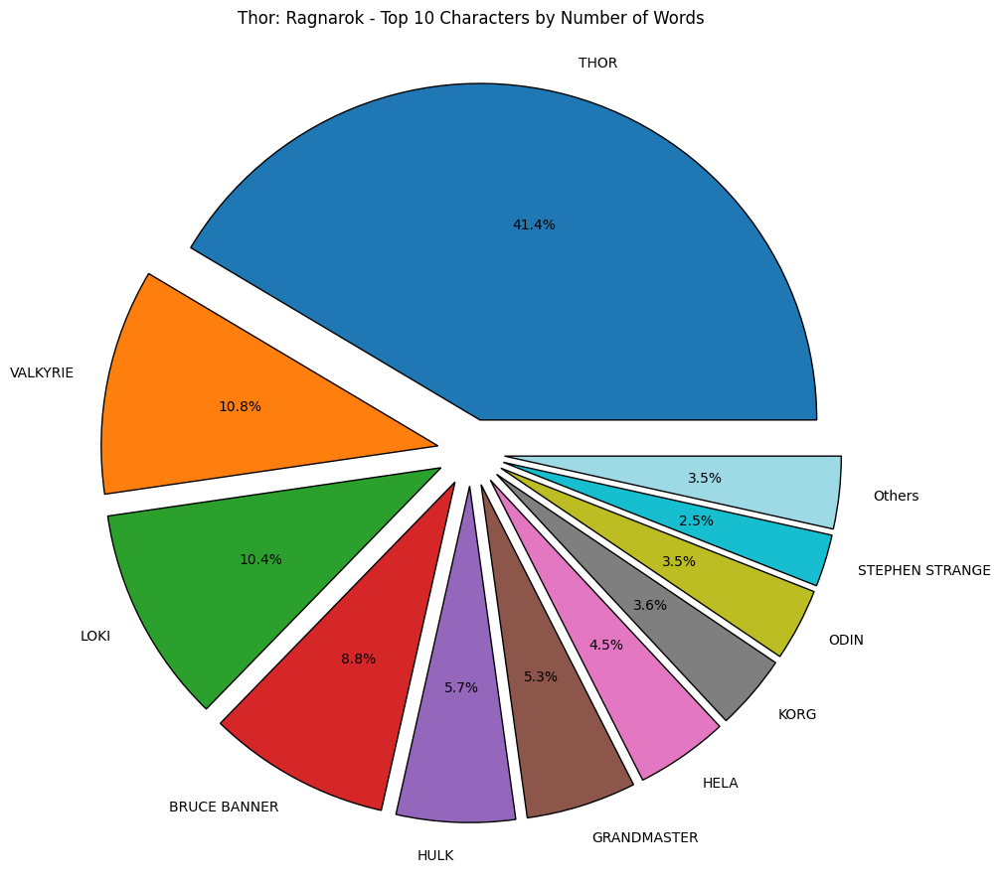

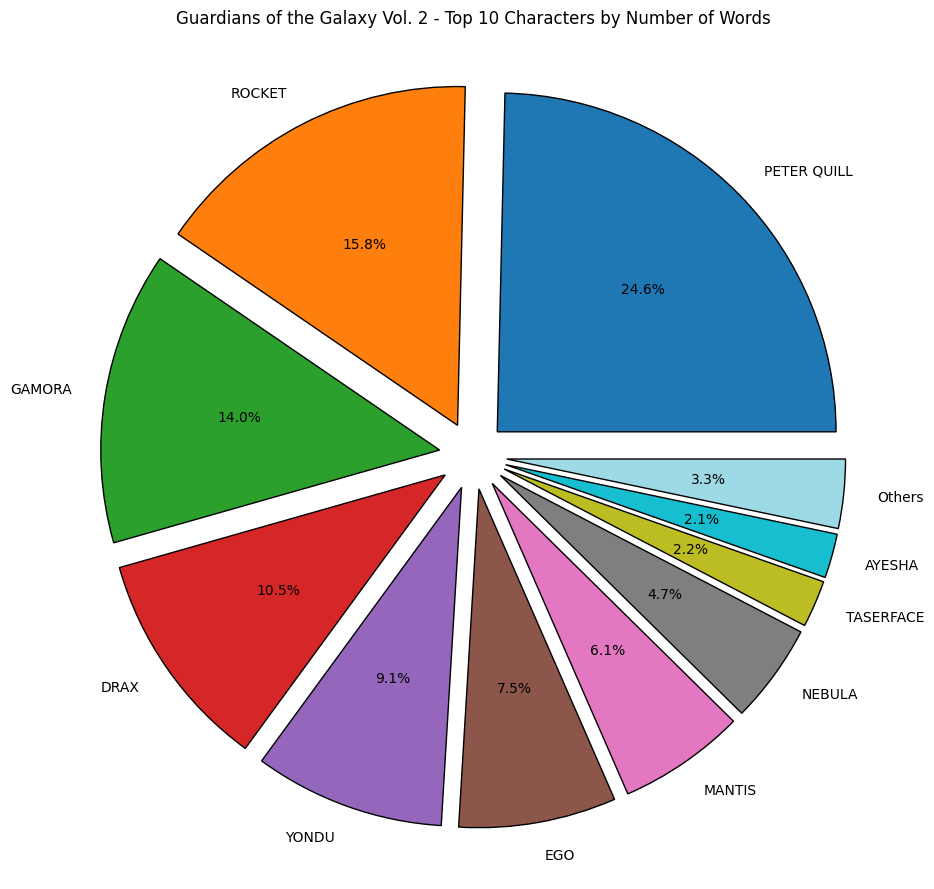

In [147]:
# for each of the top 10 movies by words, plotting the number of words spoken by each character
top_10_movies = movie_words.index
for movie in top_10_movies:
    movie_data = mcu_dataset[mcu_dataset['movie'] == movie]
    movie_character_words = movie_data.groupby('character')['words'].count()
    movie_character_words = movie_character_words.sort_values(ascending=False)
    others = movie_character_words[10:].count()
    movie_character_words = movie_character_words[:10]
    characters = movie_character_words.index
    words = movie_character_words.values
    characters = np.append(characters[:10], 'Others')
    words = np.append(words, others)
    colors = cm.tab20(np.linspace(0, 1, len(characters)))
    explode = np.ones(len(characters)) * 0.1
    plt.figure(figsize=(11, 11))
    plt.pie(words, labels=characters, autopct='%1.1f%%', colors=colors, explode=explode, wedgeprops={'edgecolor': 'black'})
    plt.title(f'{movie} - Top 10 Characters by Number of Words')
    plt.show()  

### Character-Gender Mapping Attempt

In [148]:
mcu_characters = pd.read_csv('MCU18/marvel-wikia-data.csv')
# data cleaning
mcu_characters = mcu_characters.drop(columns=['urlslug', 'ID', 'Year', 'page_id'])
mcu_characters['name'] = mcu_characters['name'].str.replace("(", " ", regex=False)
mcu_characters['name'] = mcu_characters['name'].str.replace(")", " ", regex=False)
mcu_characters['name'] = mcu_characters['name'].str.replace('\"', '', regex=False)
mcu_characters['name'] = mcu_characters['name'].str.replace('\\', '', regex=False)
mcu_characters['name'] = mcu_characters['name'].str.upper()
mcu_characters.head(20)

,name,ALIGN,EYE,HAIR,SEX,GSM,ALIVE,APPEARANCES,FIRST APPEARANCE
0,SPIDER-MAN PETER PARKER,Good Characters,Hazel Eyes,Brown Hair,Male Characters,NaN,Living Characters,4043.0,Aug-62
1,CAPTAIN AMERICA STEVEN ROGERS,Good Characters,Blue Eyes,White Hair,Male Characters,NaN,Living Characters,3360.0,Mar-41
2,WOLVERINE JAMES LOGAN HOWLETT,Neutral Characters,Blue Eyes,Black Hair,Male Characters,NaN,Living Characters,3061.0,Oct-74
3,IRON MAN ANTHONY TONY STARK,Good Characters,Blue Eyes,Black Hair,Male Characters,NaN,Living Characters,2961.0,Mar-63
4,THOR THOR ODINSON,Good Characters,Blue Eyes,Blond Hair,Male Characters,NaN,Living Characters,2258.0,Nov-50
5,BENJAMIN GRIMM EARTH-616,Good Characters,Blue Eyes,No Hair,Male Characters,NaN,Living Characters,2255.0,Nov-61
6,REED RICHARDS EARTH-616,Good Characters,Brown Eyes,Brown Hair,Male Characters,NaN,Living Characters,2072.0,Nov-61
7,HULK ROBERT BRUCE BANNER,Good Characters,Brown Eyes,Brown Hair,Male Characters,NaN,Living Characters,2017.0,May-62
8,SCOTT SUMMERS EARTH-616,Neutral Characters,Brown Eyes,Brown Hair,Male Characters,NaN,Living Characters,1955.0,Sep-63
9,JONATHAN STORM EARTH-616,Good Characters,Blue Eyes,Blond Hair,Male Characters,NaN,Living Characters,1934.0,Nov-61


In [149]:
print(character_dialogues)

character
TONY STARK          1788
STEVE ROGERS         977
THOR                 863
PETER PARKER         551
NATASHA ROMANOFF     498
PEPPER POTTS         442
BRUCE BANNER         379
NICK FURY            366
LOKI                 327
SCOTT LANG           324
Name: words, dtype: int64


In [150]:
# print the column names of the dataframe
characters = df1.columns[0]
all_characters = df1[characters].unique()
print(len(all_characters))
print(all_characters)

652
['TONY STARK' 'STEVE ROGERS' 'THOR' 'PETER PARKER' 'NATASHA ROMANOFF'
 'PEPPER POTTS' 'BRUCE BANNER' 'NICK FURY' 'LOKI' 'SCOTT LANG'
 'JAMES RHODES' 'PETER QUILL' 'CAROL DANVERS' 'JANE FOSTER' 'ROCKET'
 'CLINT BARTON' 'SAM WILSON' 'GAMORA' "T'CHALLA" 'HAPPY HOGAN' 'HANK PYM'
 'ODIN' 'JARVIS' 'NED LEEDS' 'ERIK SELVIG' 'PHIL COULSON' 'BUCKY BARNES'
 'THANOS' 'DRAX' 'WANDA MAXIMOFF' 'DARCY LEWIS' 'ADRIAN TOOMES'
 'PEGGY CARTER' 'SHURI' 'HOPE VAN DYNE' 'VALKYRIE' 'LUIS' 'JUSTIN HAMMER'
 'ULTRON' 'MARIA HILL' 'NEBULA' 'STEPHEN STRANGE' 'VISION' 'VOLSTAGG'
 'NAKIA' 'LIZ TOOMES' 'YON-ROGG' 'YONDU' 'FRIGGA' 'OKOYE' 'KAREN' 'MANTIS'
 'EVERETT ROSS' 'MAYA HANSEN' 'HOWARD STARK' 'SIF' 'ALEXANDER PIERCE'
 'COL. CHESTER PHILLIPS' 'TALOS' 'ALDRICH KILLIAN' 'EGO' 'FANDRAL'
 'RED SKULL' 'DARREN CROSS' "N'JADAKA (KILLMONGER)" 'HEIMDALL'
 'HARLEY KEENER' 'OBADIAH STANE' 'JAMES "JIM" PAXTON' 'BROCK RUMLOW'
 'MAY PARKER' 'MARIA RAMBEAU' 'HULK' 'DR. ARNIM ZOLA' 'YINSEN' 'FRIDAY'
 'ULYSSES KLAUE' 'GRAND

### Word distribution analysis

In [151]:
# load pre-trained tokenizer 
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [152]:
# iterate over each row 
for index, row in mcu_dataset.iterrows():
    line = row['line']
    tokens = tokenizer.tokenize(line)
    print(tokens)
    if index == 5:
        break

['oh', ',', 'i', 'get', 'it', '.', 'you', 'guys', 'aren', '’', 't', 'allowed', 'to', 'talk', '.', 'is', 'that', 'it', '?', 'are', 'you', 'not', 'allowed', 'to', 'talk', '?']
['no', '.', 'we', '’', 're', 'allowed', 'to', 'talk', '.']
['oh', '.', 'i', 'see', '.', 'so', 'it', '’', 's', 'personal', '.']
['i', 'think', 'they', '’', 're', 'intimidated', '.']
['good', 'god', ',', 'you', '’', 're', 'a', 'woman', '.', 'i', ',', 'honestly', ',', 'i', 'couldn', '’', 't', 'have', 'called', 'that', '.', 'i', 'would', 'apologize', ',', 'but', 'isn', '’', 't', 'that', 'what', 'we', '’', 're', 'going', 'for', 'here', '?', 'i', 'saw', 'you', 'as', 'a', 'soldier', 'first', '.']
['i', 'have', 'a', 'question', ',', 'sir', '.']


In [153]:
mcu_tokenized = mcu_dataset.copy()
mcu_tokenized['tokens'] = mcu_dataset['line'].apply(lambda x: tokenizer.tokenize(x))

In [154]:
all_words = []
for tokens in mcu_tokenized['tokens']:
    all_words.extend(tokens)
all_words = [word for word in all_words if word.isalnum()]

#### Word Cloud for the dataset

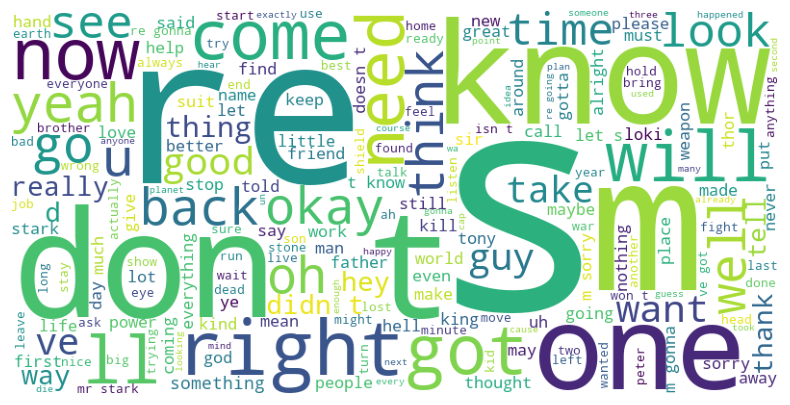

In [155]:
# plot a word cloud 
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

#### Character-wise Word Cloud for top 10 characters (with most words)

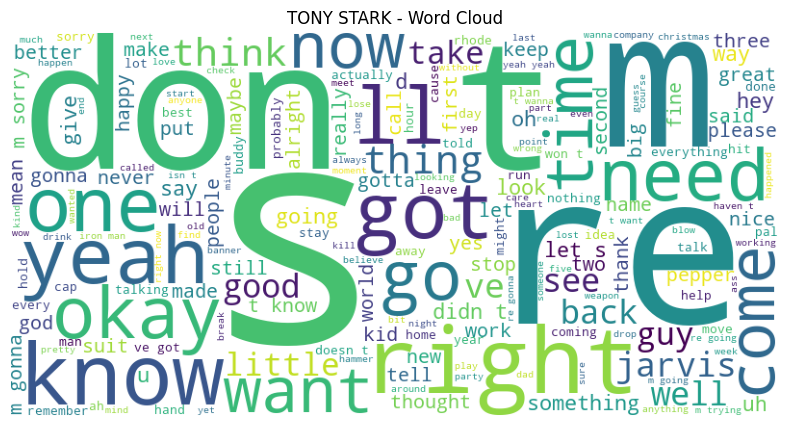

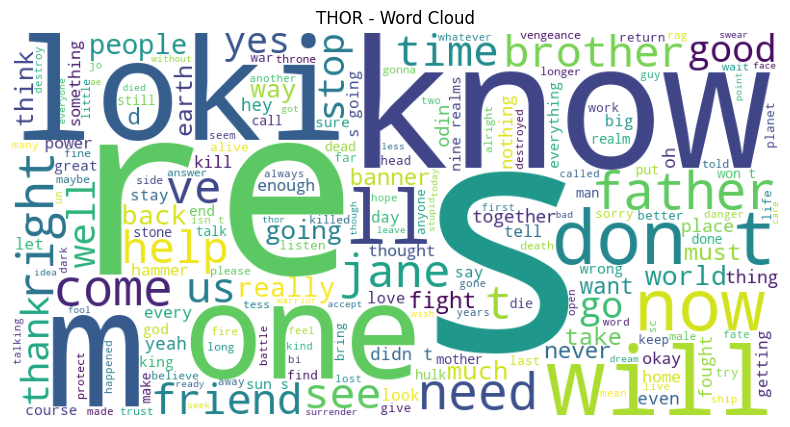

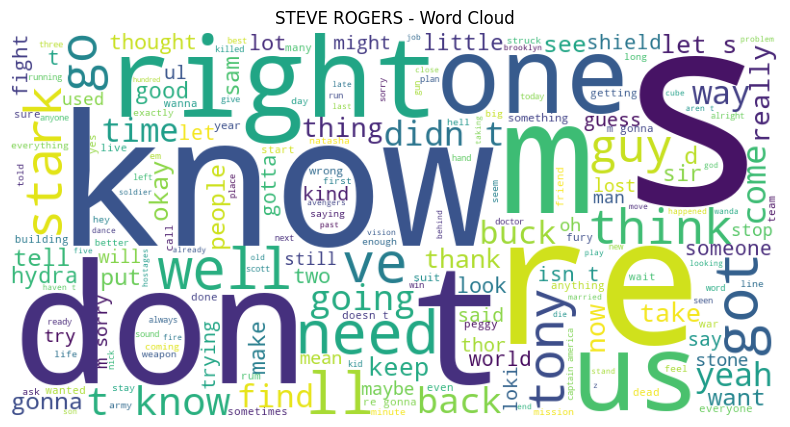

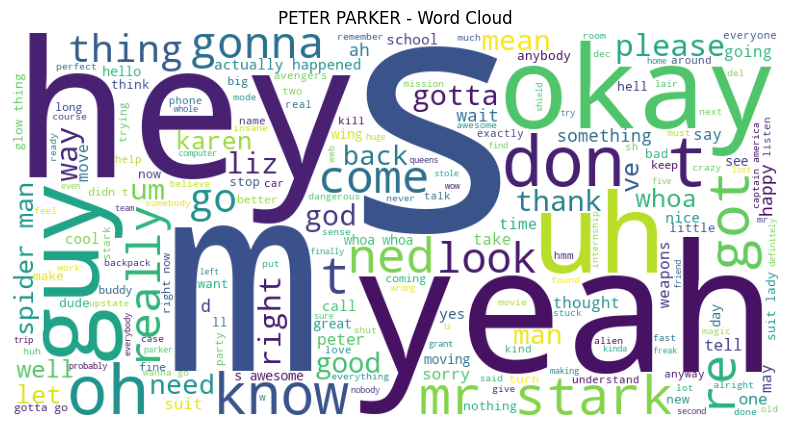

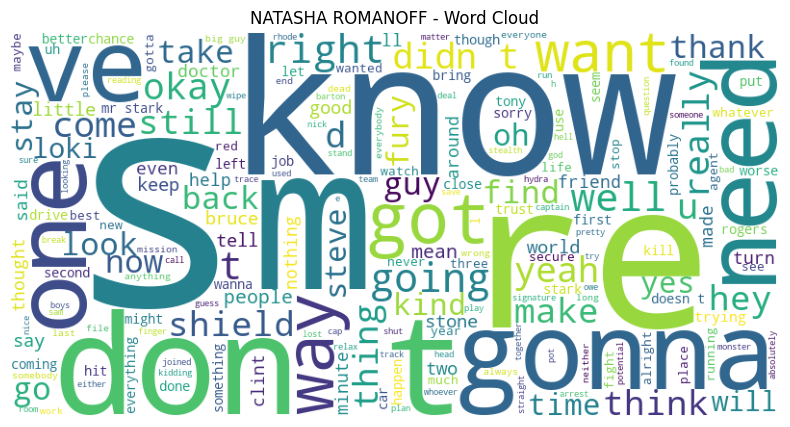

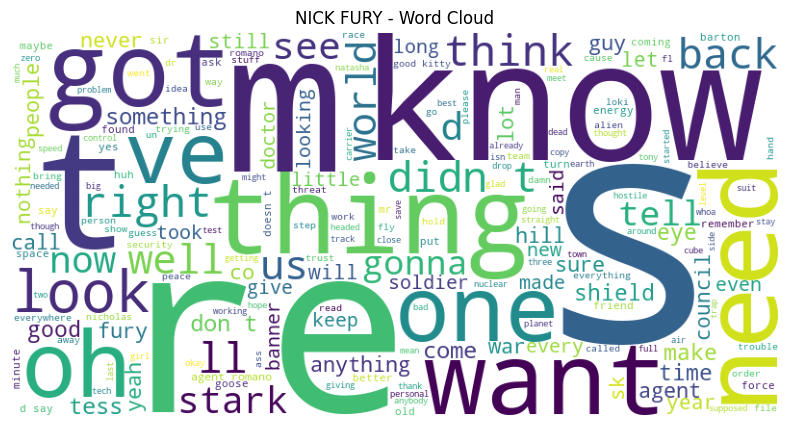

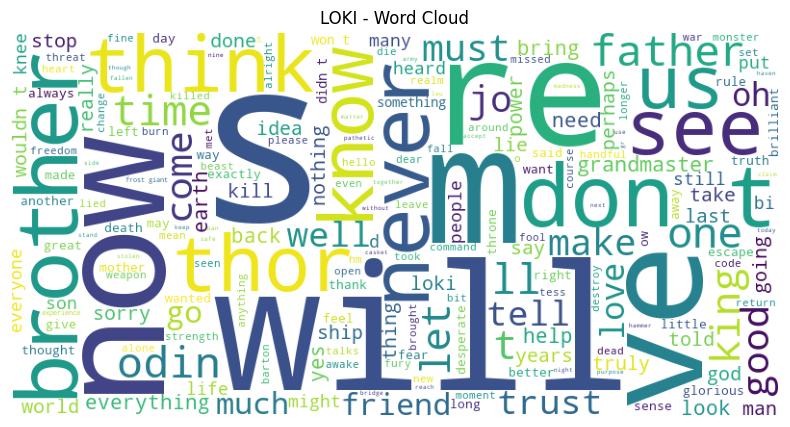

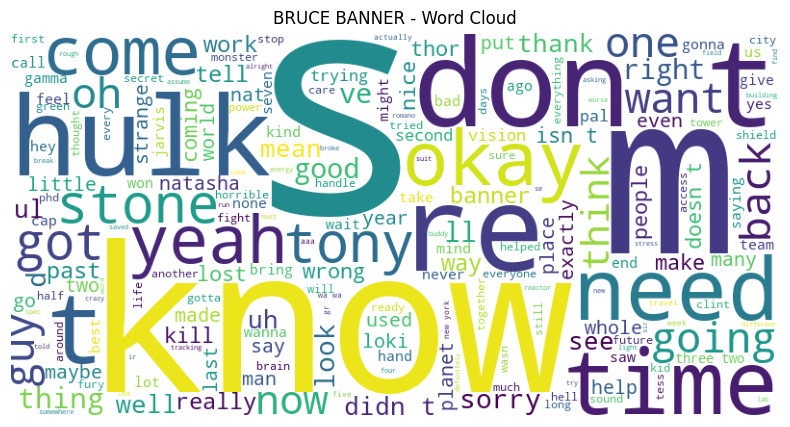

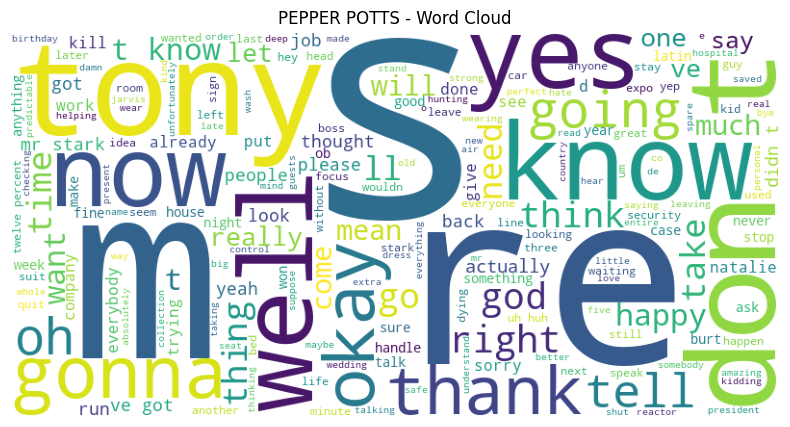

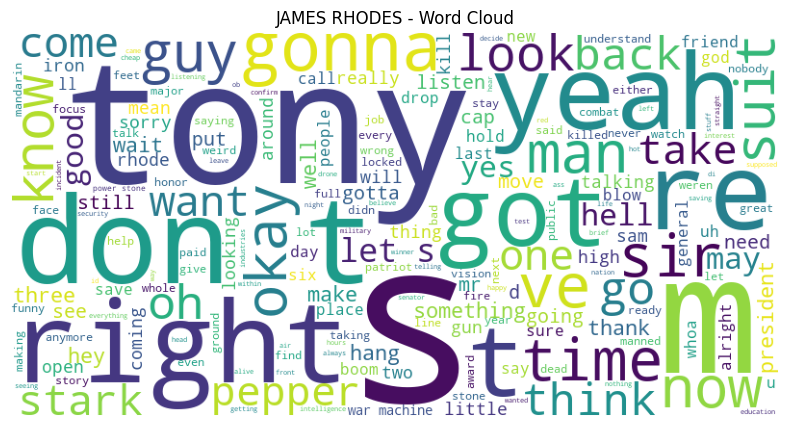

In [156]:
top_characters = character_words.index
for character in top_characters:
    character_data = mcu_tokenized[mcu_tokenized['character'] == character]
    character_words = []
    for tokens in character_data['tokens']:
        character_words.extend(tokens)
    character_words = [word for word in character_words if word.isalnum()]
    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(character_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'{character} - Word Cloud')
    plt.show()

#### Character-wise Word Cloud for top 10 characters (with most dialogues)

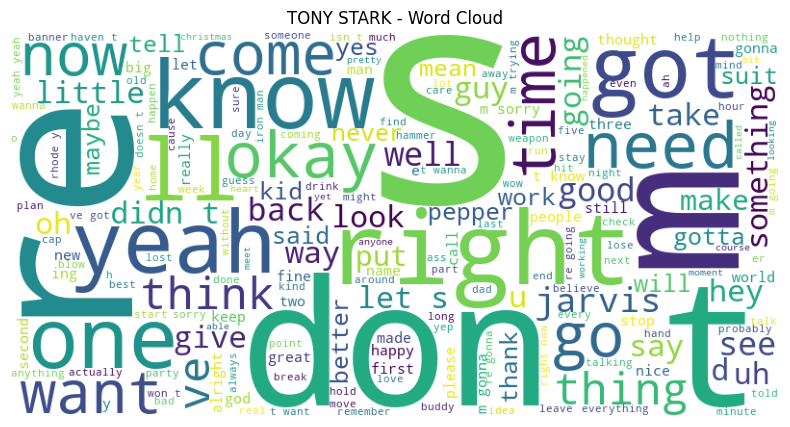

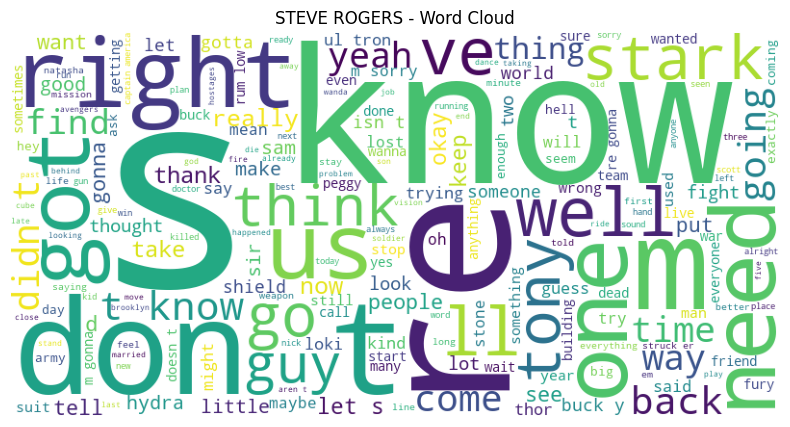

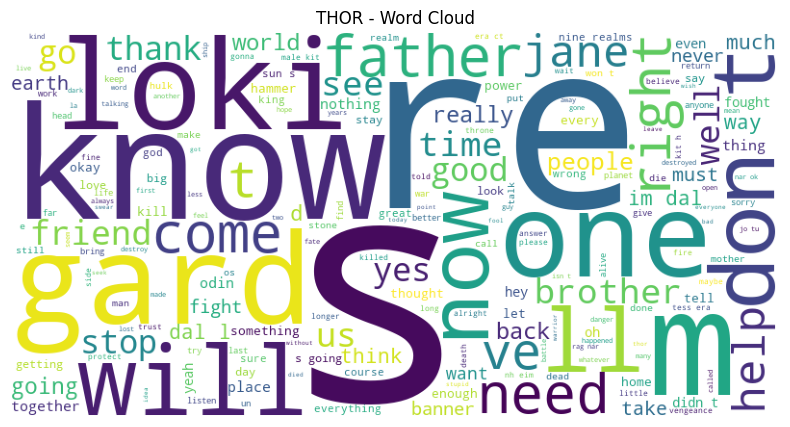

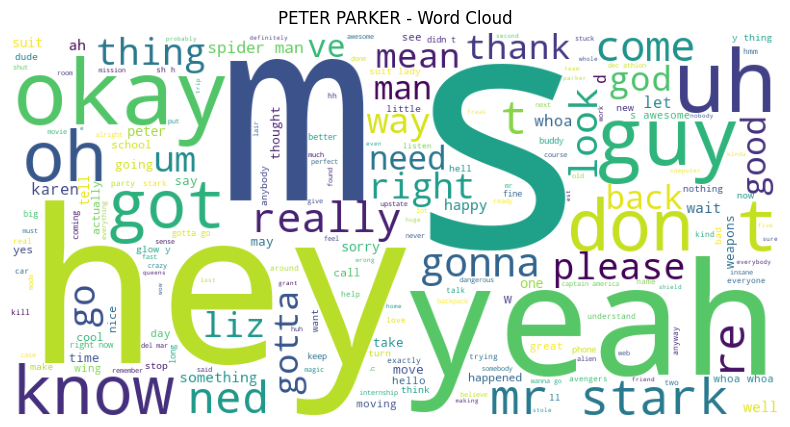

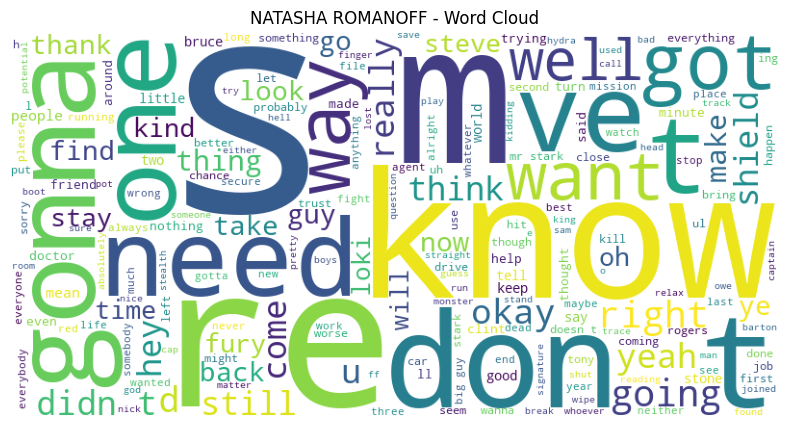

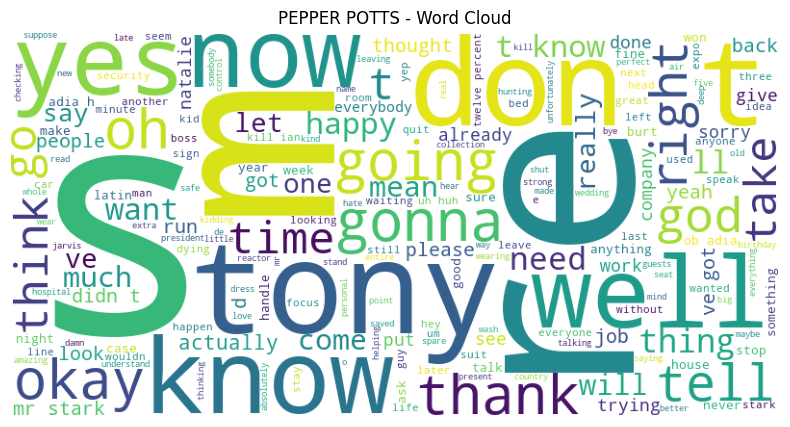

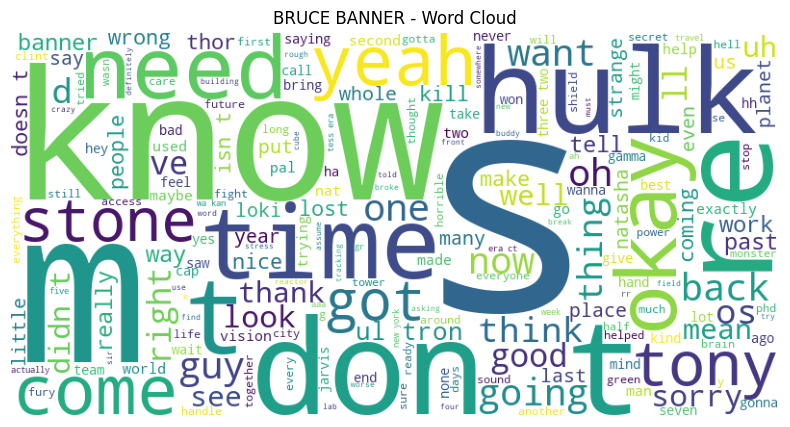

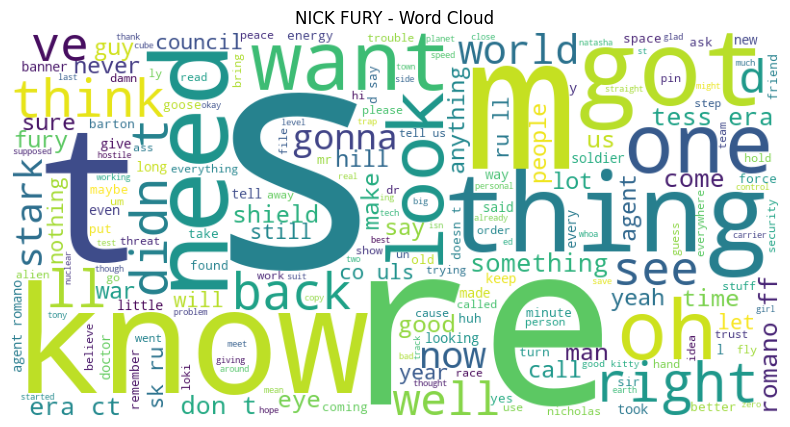

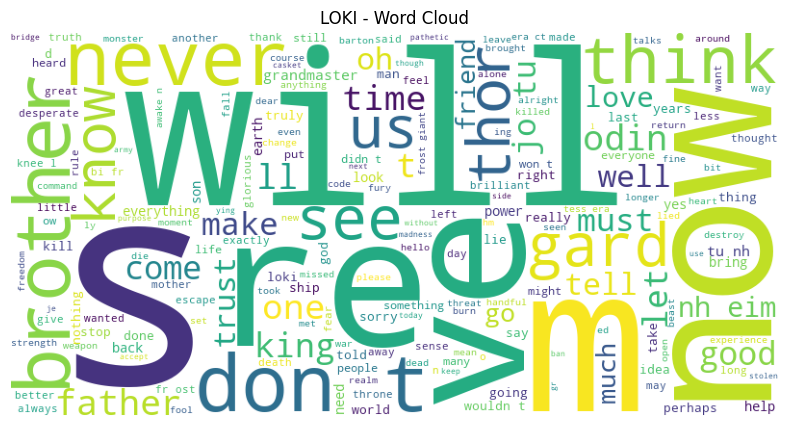

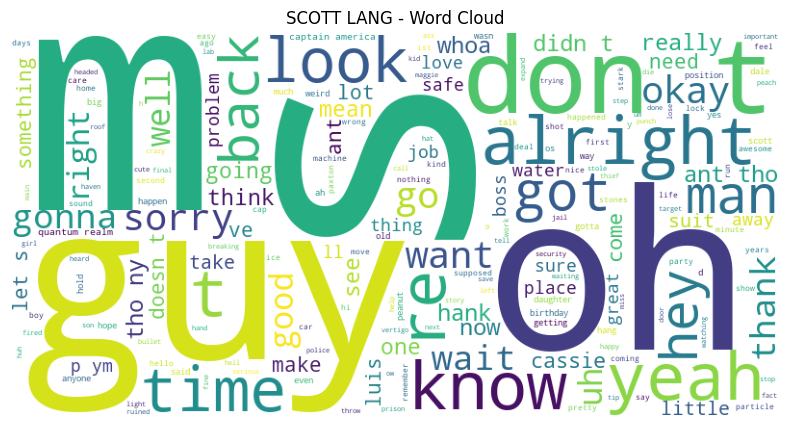

In [157]:
top_characters = character_dialogues.index
for character in top_characters:
    character_data = mcu_tokenized[mcu_tokenized['character'] == character]
    character_words = []
    for tokens in character_data['tokens']:
        character_words.extend(tokens)
    wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(' '.join(character_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f'{character} - Word Cloud')
    plt.show()

#### Most common alphanumeric tokens in the dataset 

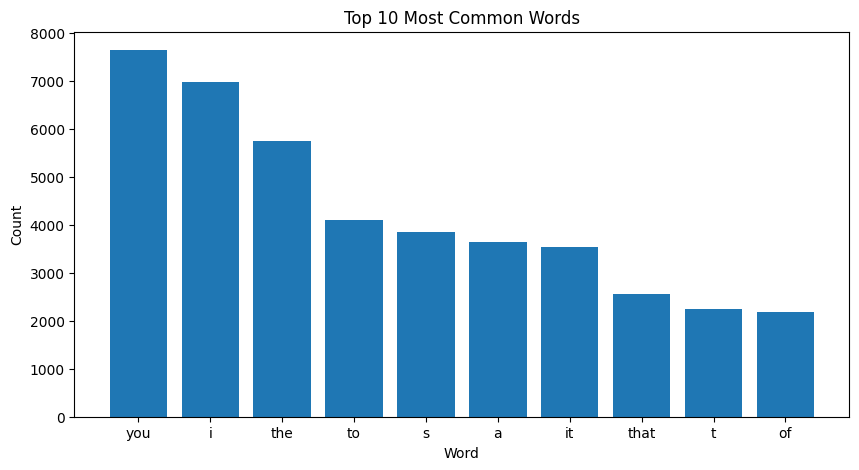

In [158]:
from collections import Counter
all_words = []
for tokens in mcu_tokenized['tokens']:
    all_words.extend(tokens)
word_counter = Counter(all_words)
word_counter = {k: v for k, v in word_counter.items() if k.isalnum()}
word_counter = {k: v for k, v in word_counter.items() if k not in ['[CLS]', '[SEP]']}
word_counter = {k: v for k, v in word_counter.items() if k not in tokenizer.all_special_tokens}
word_counter = {k: v for k, v in word_counter.items() if k not in tokenizer.all_special_ids}
word_counter = {k: v for k, v in word_counter.items() if k not in tokenizer.all_special_tokens_extended}

word_counter = dict(sorted(word_counter.items(), key=lambda x: x[1], reverse=True))
words = list(word_counter.keys())[:10]
counts = list(word_counter.values())[:10]
plt.figure(figsize=(10, 5))
plt.bar(words, counts)
plt.xlabel('Word')
plt.ylabel('Count')
plt.title('Top 10 Most Common Words')
plt.show()